In [85]:
# ==================================================
# Imports
# ==================================================

import os
import sys

import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

import unidecode

In [87]:
# ==================================================
# Configuració del projecte
# ==================================================

PROJECT_ROOT = os.path.abspath("..")

if PROJECT_ROOT not in sys.path:
    sys.path.append(PROJECT_ROOT)

from src.config import (
    DATA_RAW,
    DATA_PROCESSED,
    FIGURES_DIR,
    TABLES_DIR,
)

from src.utils_io import (
    load_csv,
    save_csv,
)

In [89]:
# ==================================================
# Carregar datasets
# ==================================================

print("Carregant datasets...")

df_cluster = load_csv(
    DATA_PROCESSED / "cluster_dataset.csv"
)

gdf = gpd.read_file(
    DATA_RAW / "0301100100_UNITATS_ADM_POLIGONS.json"
)

print("Dataset clustering:", df_cluster.shape)
print("Dataset geogràfic:", gdf.shape)

Carregant datasets...
Dataset clustering: (1898, 31)
Dataset geogràfic: (1501, 36)


In [90]:
# ==================================================
# Filtrar barris
# ==================================================

print("\nFiltrant geometries de barris...")

gdf_barris = (

    gdf[
        gdf["TIPUS_UA"] == "BARRI"
    ]
    .copy()

)

print("Nombre de barris:", len(gdf_barris))


Filtrant geometries de barris...
Nombre de barris: 73


In [91]:
# ==================================================
# Funció de normalització
# ==================================================

def normalize(text):

    if pd.isna(text):
        return text

    return (

        unidecode.unidecode(str(text).lower())

        .replace(",", "")
        .replace("-", " ")
        .replace("'", "")

        .replace("   ", " ")
        .replace("  ", " ")

        .strip()

    )

In [92]:
# ==================================================
# Harmonitzar noms territorials
# ==================================================

print("\nNormalitzant territoris...")

df_cluster["territori_norm"] = (
    df_cluster["territori"]
    .apply(normalize)
)

gdf_barris["territori_norm"] = (
    gdf_barris["NOM"]
    .apply(normalize)
)


Normalitzant territoris...


In [97]:
# ==================================================
# Merge espacial
# ==================================================

print("\nFusionant dades espacials...")

df_geo = pd.merge(

    df_cluster,

    gdf_barris[
        [
            "NOM",
            "territori_norm",
            "geometry",
        ]
    ],

    on="territori_norm",

    how="left",

)

df_geo = gpd.GeoDataFrame(

    df_geo,

    geometry="geometry",

    crs=gdf_barris.crs,

)

print("Dataset espacial final:", df_geo.shape)


Fusionant dades espacials...
Dataset espacial final: (1898, 34)


In [99]:
# ==================================================
# Verificació de geometries mancants
# ==================================================

missing_geo = df_geo[
    df_geo["geometry"].isna()
]

print("\nTerritoris sense geometria:")

print(
    missing_geo[
        ["territori"]
    ]
    .drop_duplicates()
)


Territoris sense geometria:
Empty DataFrame
Columns: [territori]
Index: []


In [101]:
# ==================================================
# Funció per generar mapes
# ==================================================

def plot_map(
    gdf,
    column,
    title,
    cmap="RdYlBu_r",
    categorical=False,
    save_name=None,
):

    fig, ax = plt.subplots(
        figsize=(10, 10)
    )

    gdf.plot(

        column=column,

        cmap=cmap,

        legend=True,

        categorical=categorical,

        edgecolor="black",

        linewidth=0.4,

        ax=ax,

    )

    ax.set_title(title)

    ax.axis("off")

    plt.tight_layout()

    if save_name:

        plt.savefig(

            FIGURES_DIR / save_name,

            dpi=300,
            bbox_inches="tight",

        )

    plt.show()


Generant mapes de clústers...


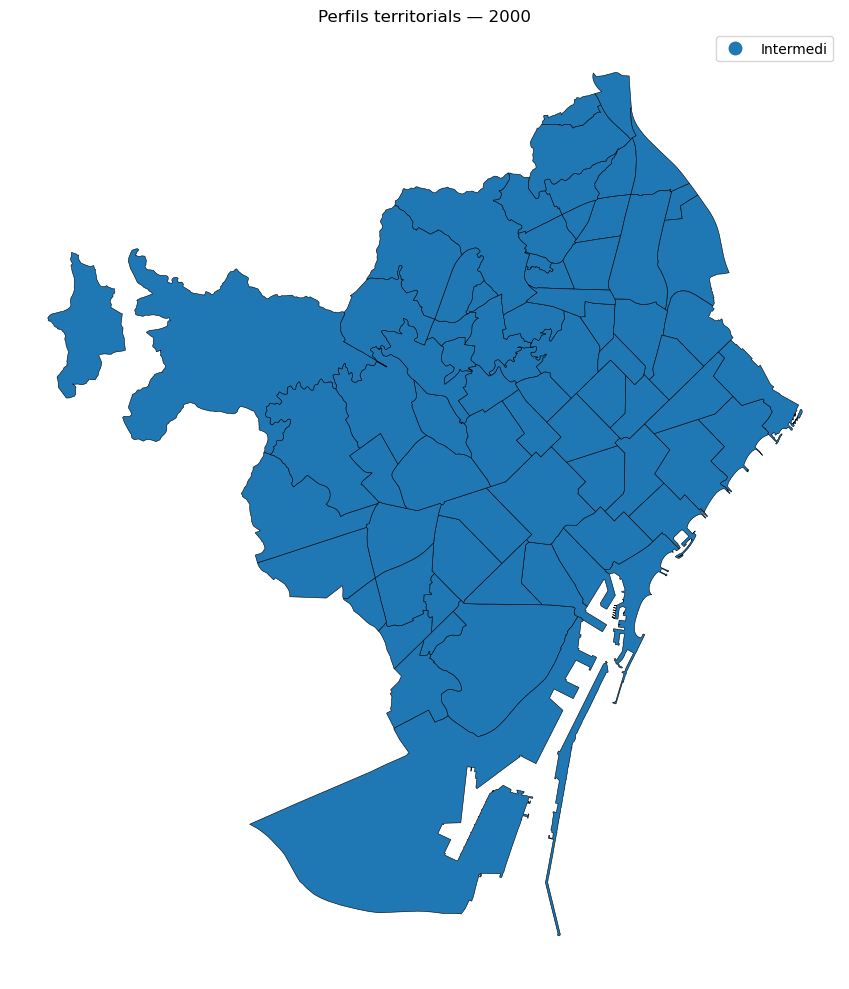

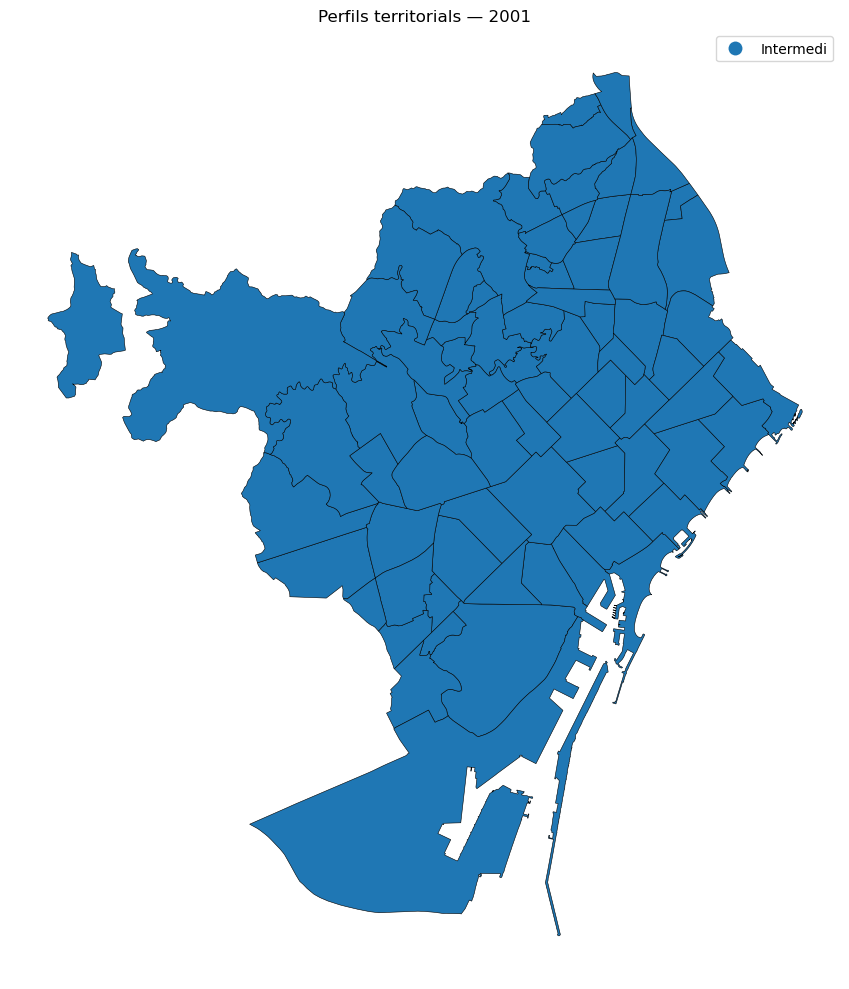

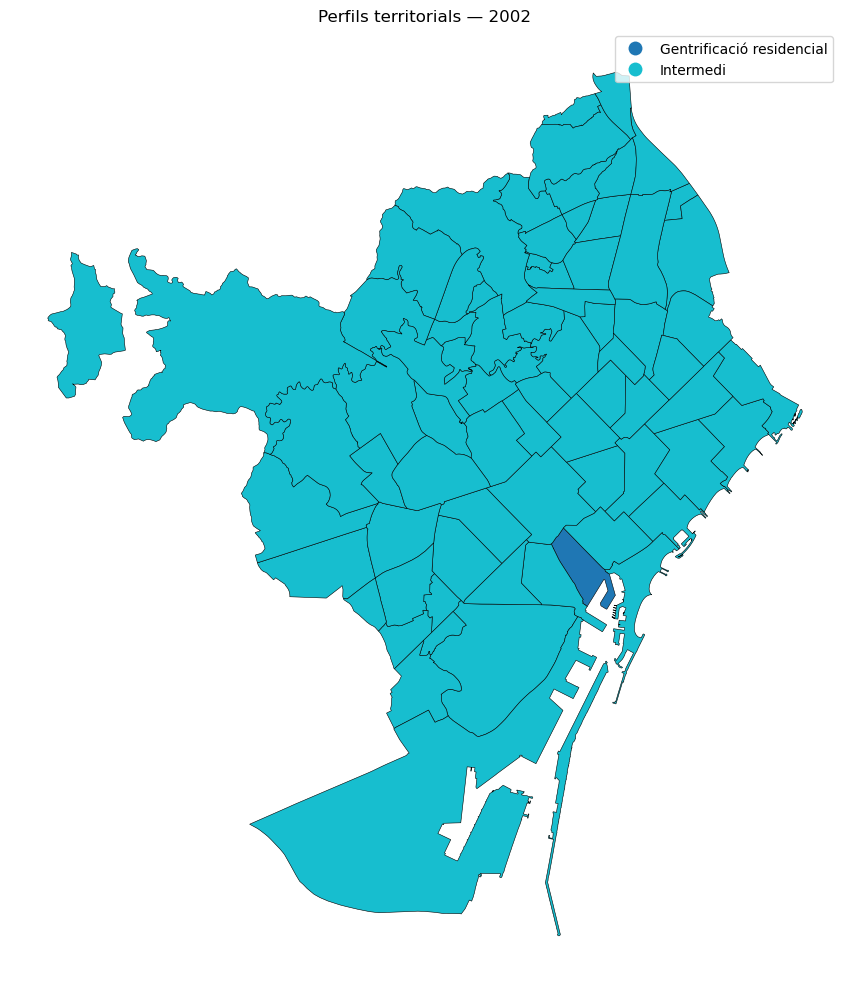

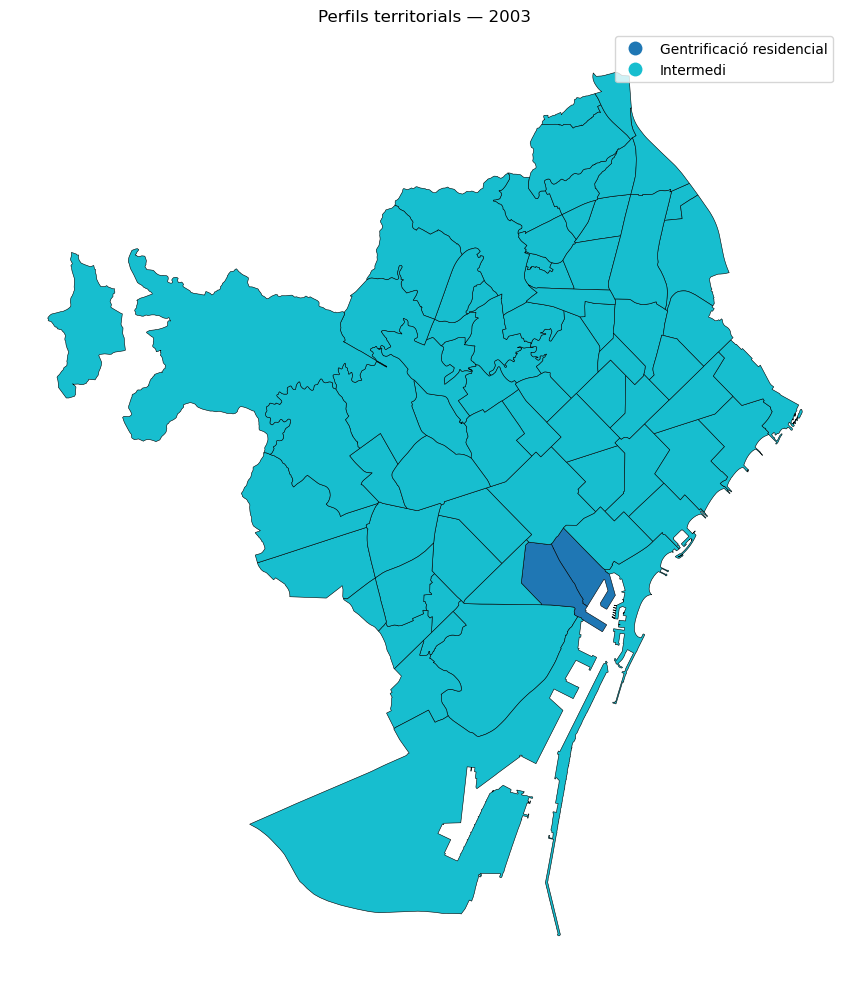

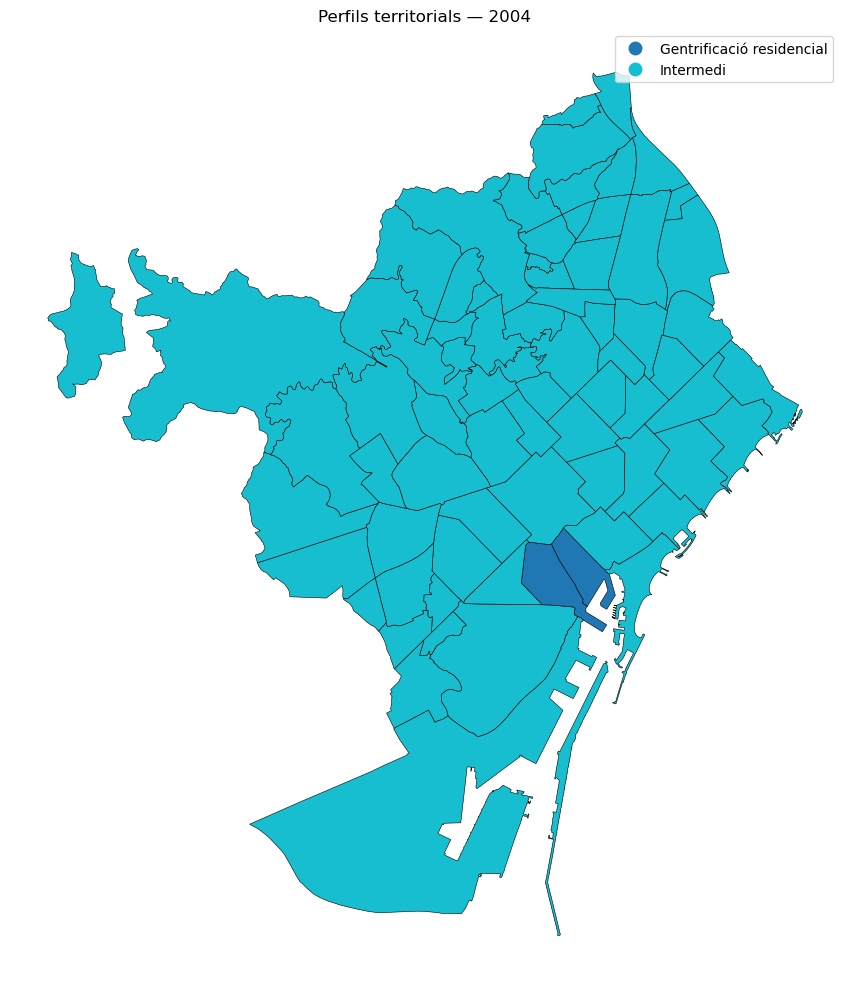

...

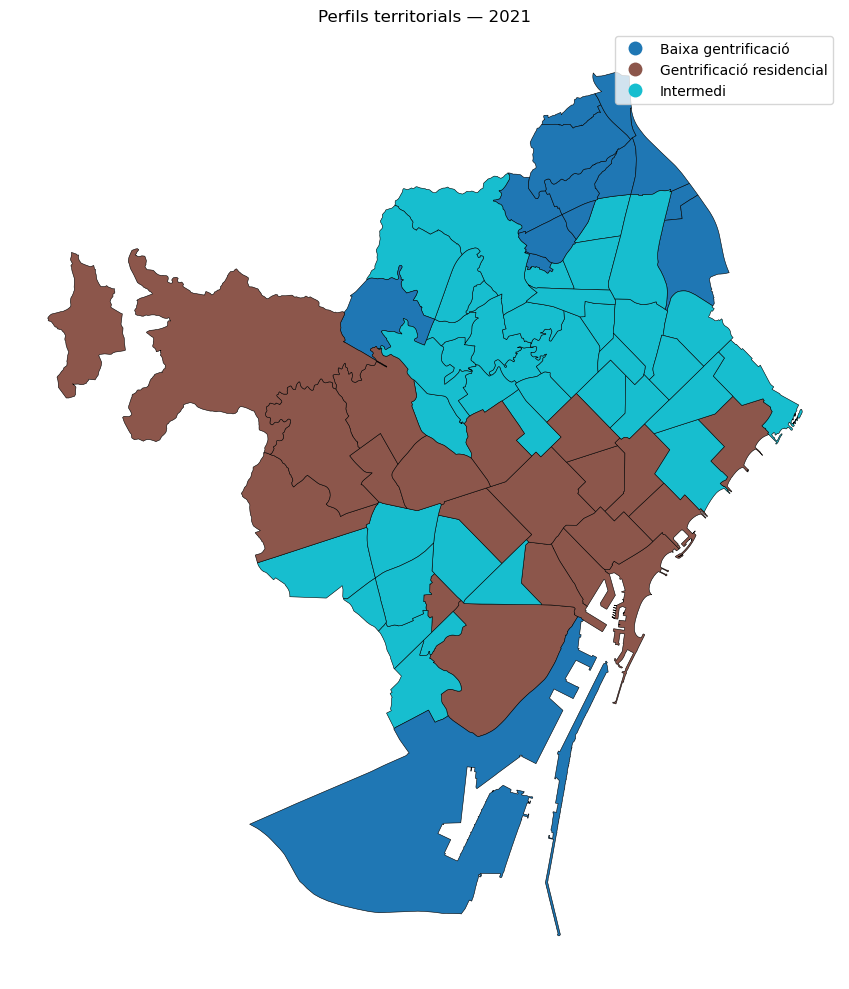

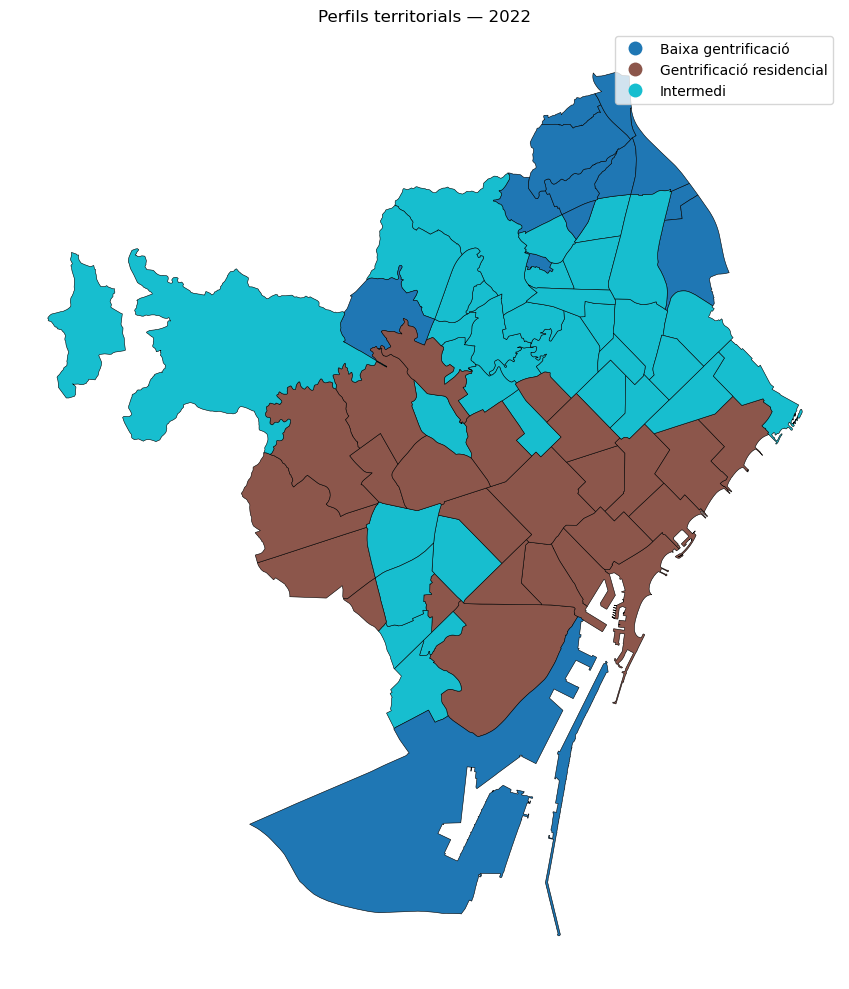

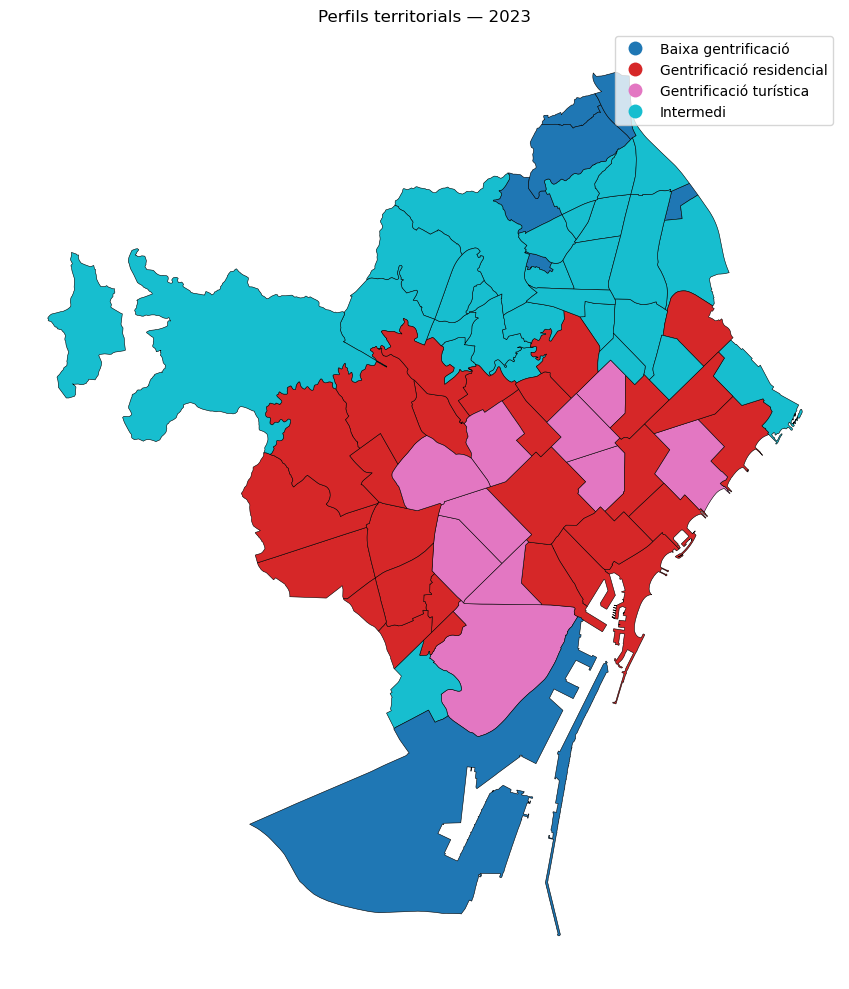

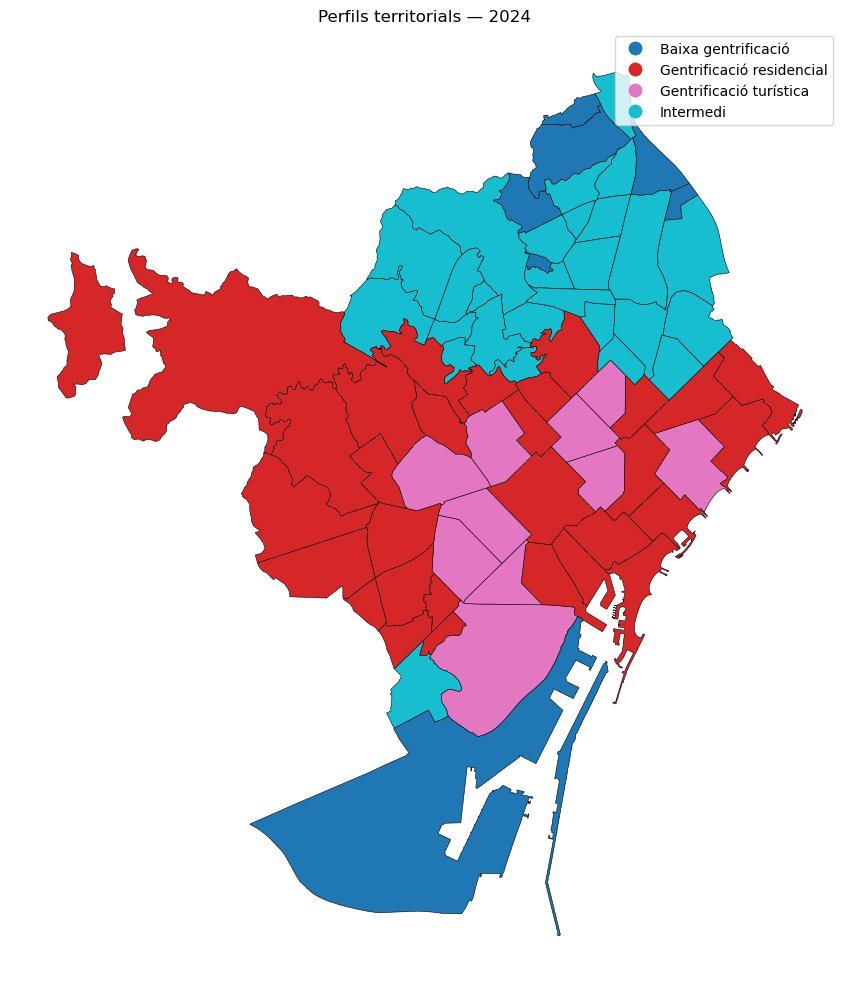

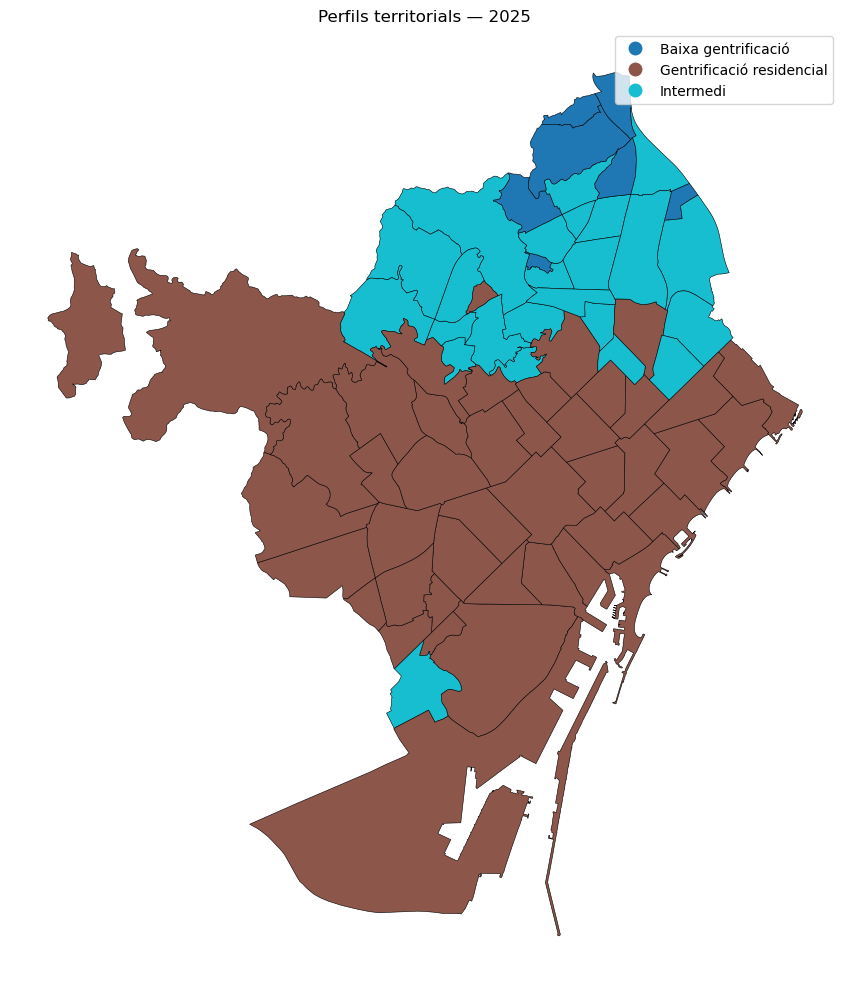

In [103]:
# ==================================================
# Mapes de clústers per any
# ==================================================

print("\nGenerant mapes de clústers...")

anys = sorted(
    df_geo["any"].dropna().unique()
)

for any_actual in anys:

    df_year = df_geo[
        df_geo["any"] == any_actual
    ]

    plot_map(

        gdf=df_year,

        column="cluster_label",

        title=f"Perfils territorials — {any_actual}",

        cmap="tab10",

        categorical=True,

        save_name=f"mapa_clusters_{any_actual}.png",

    )


Generant mapes de gentrificació...


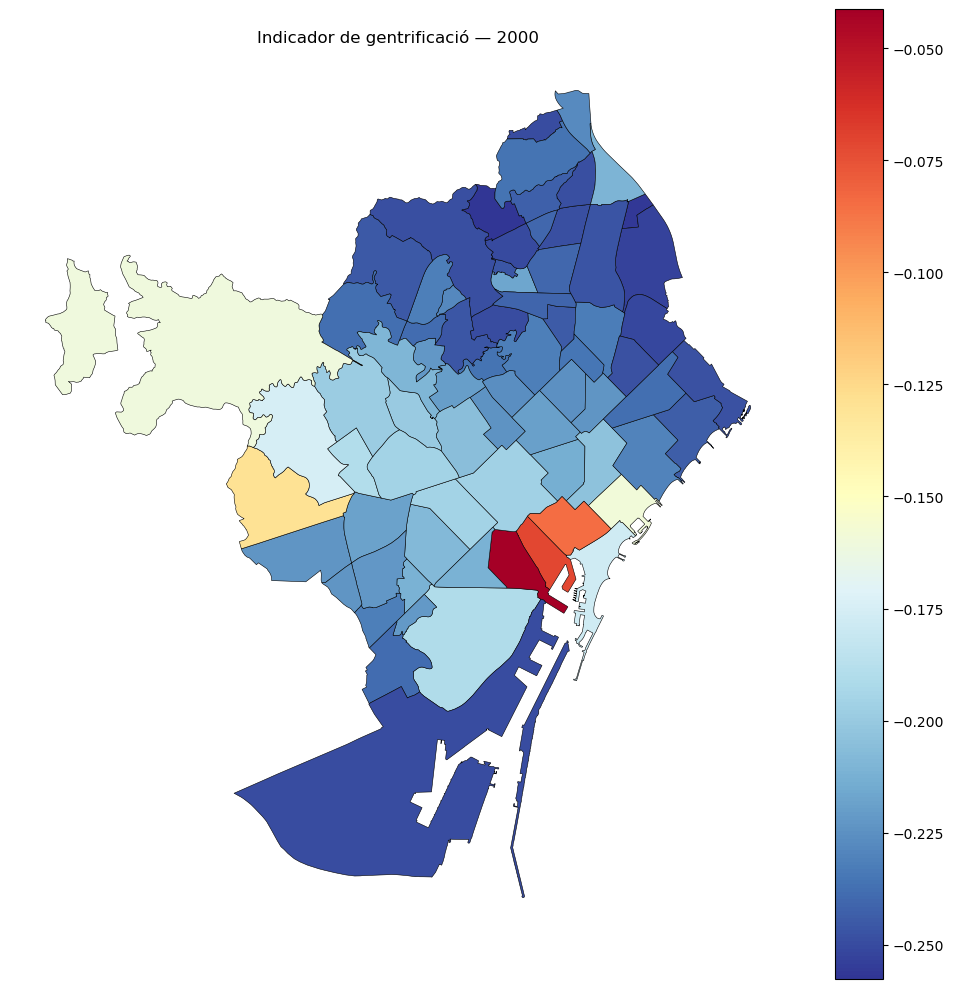

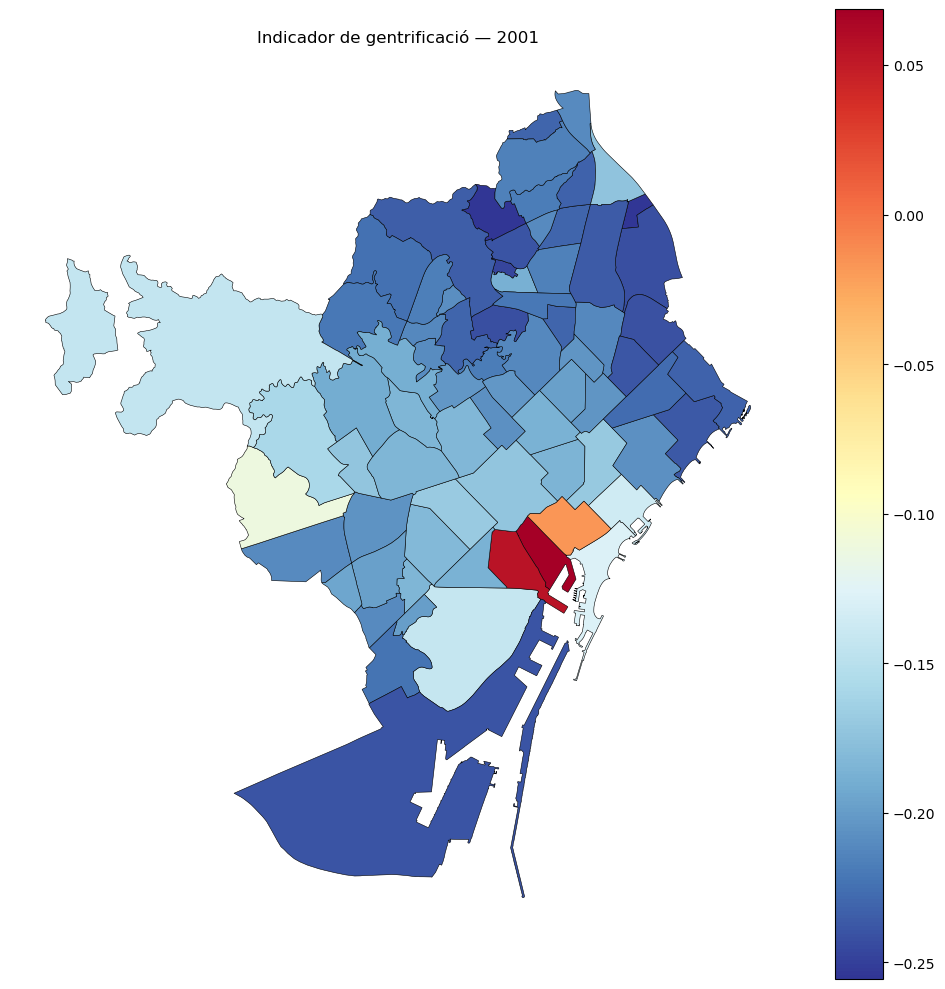

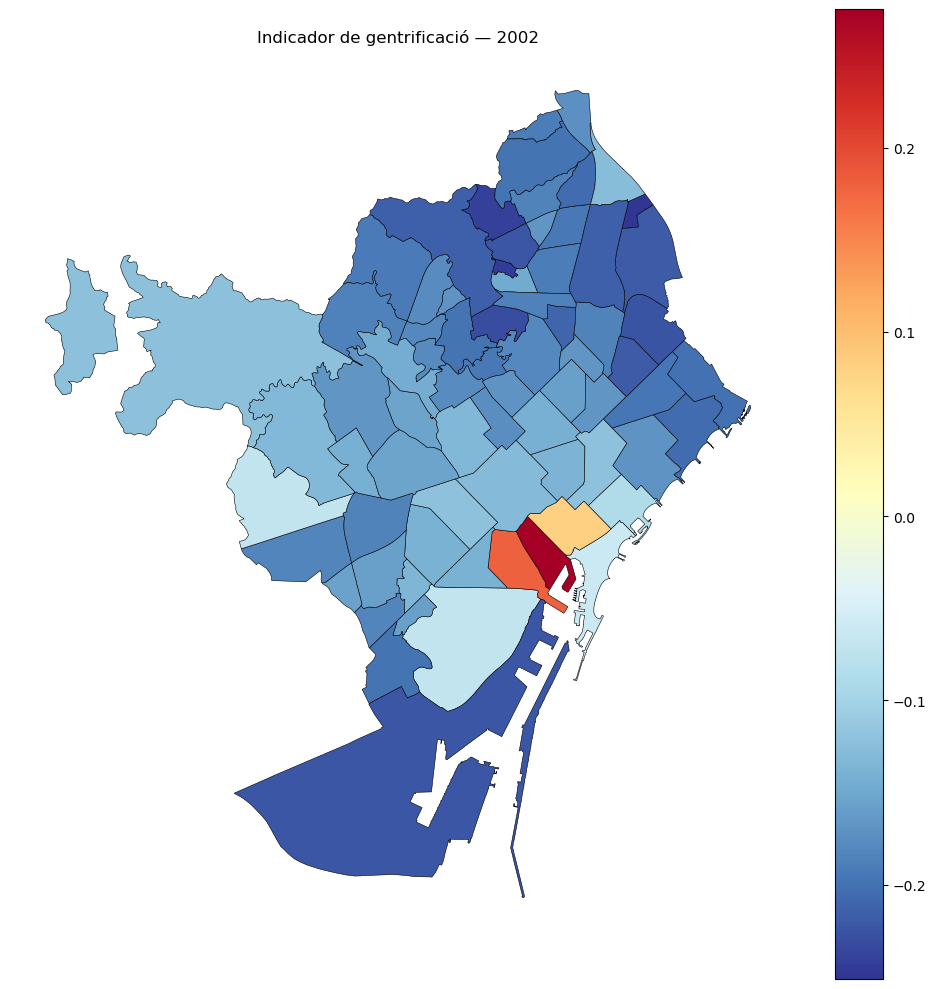

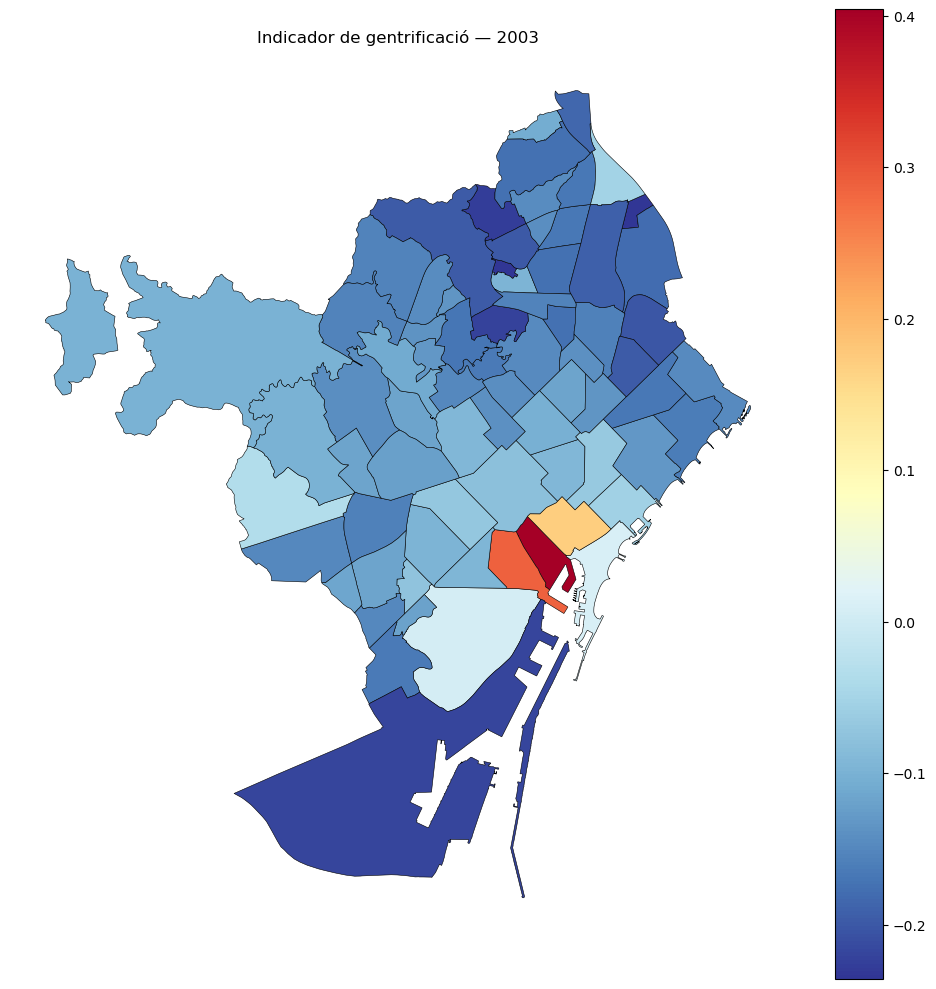

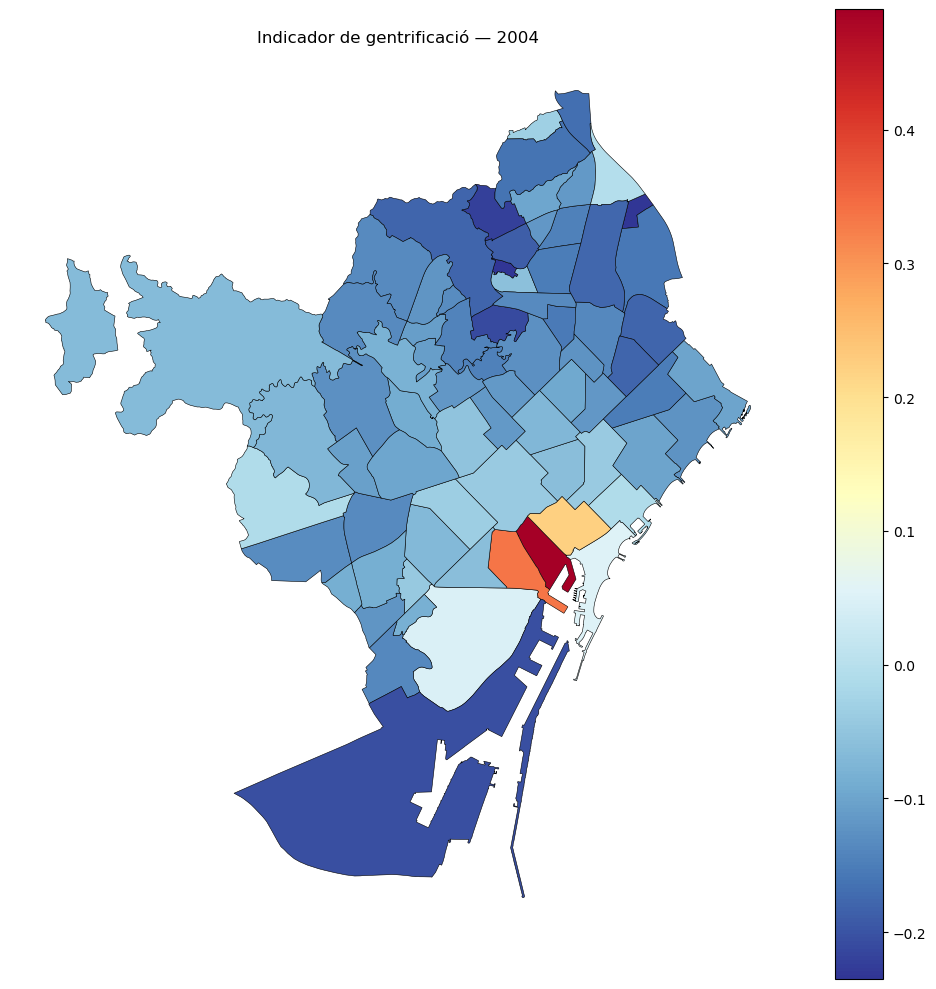

...

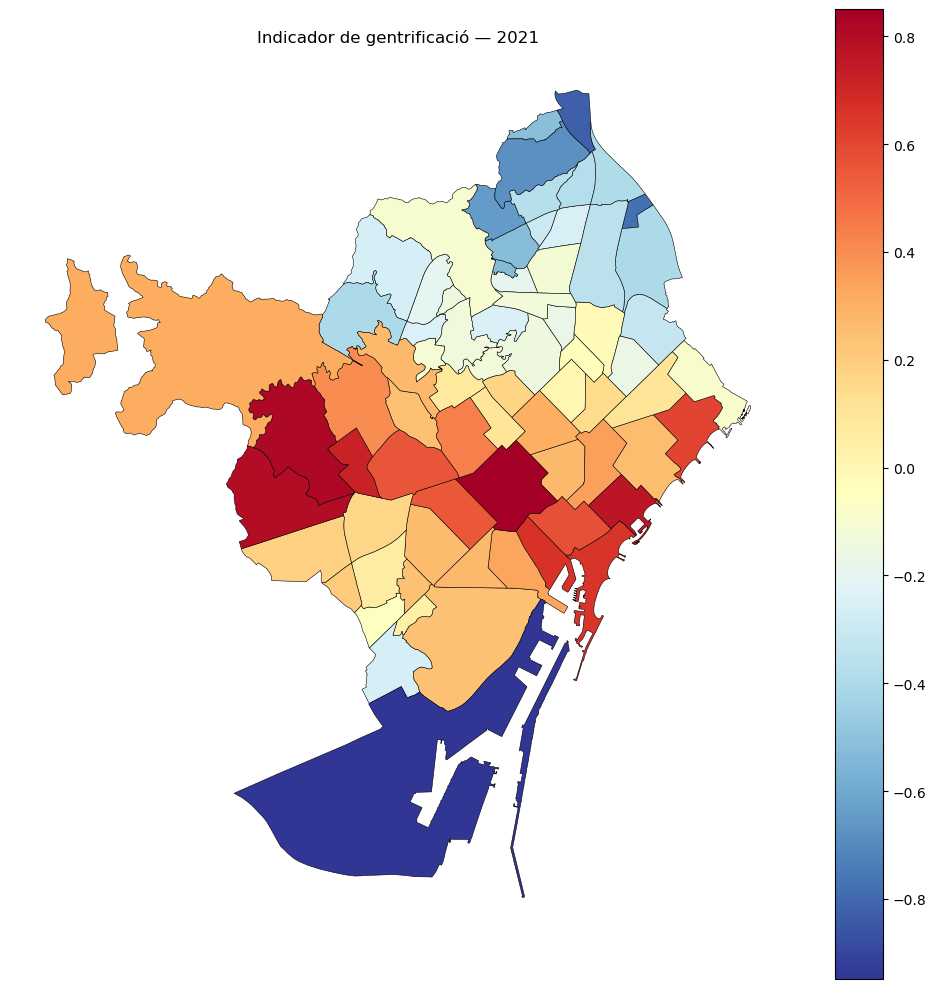

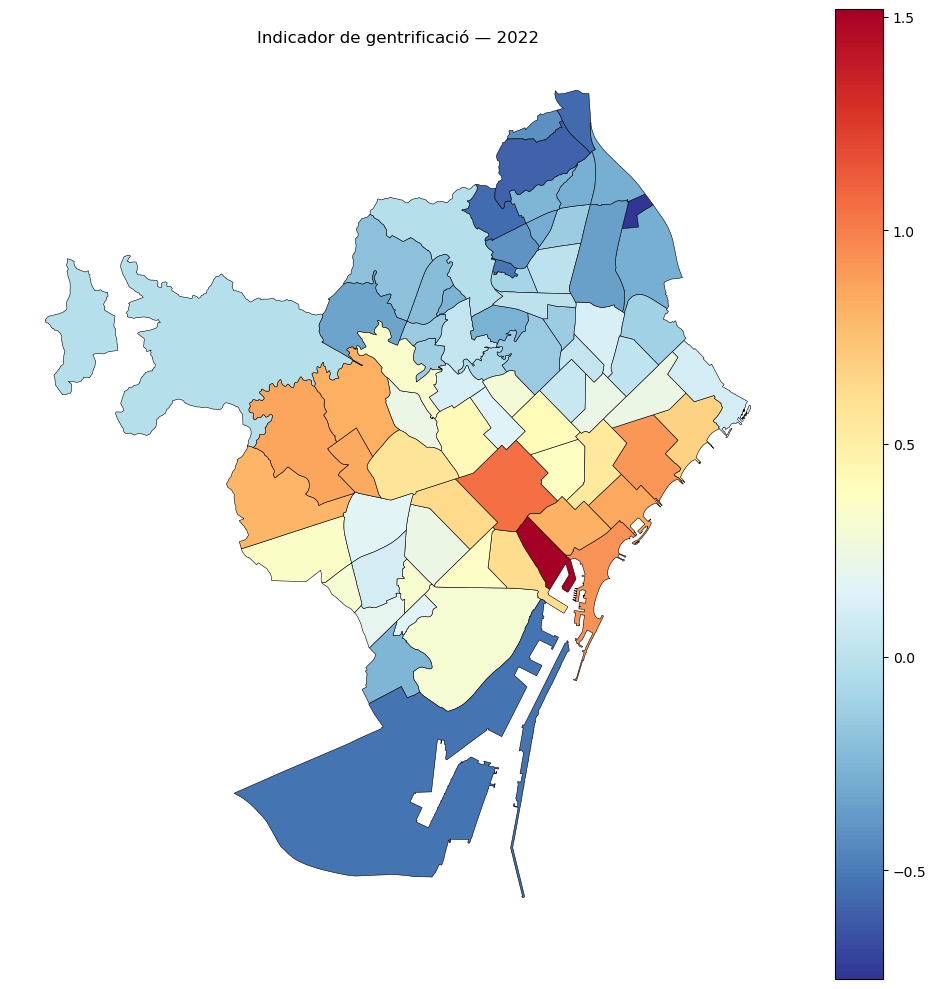

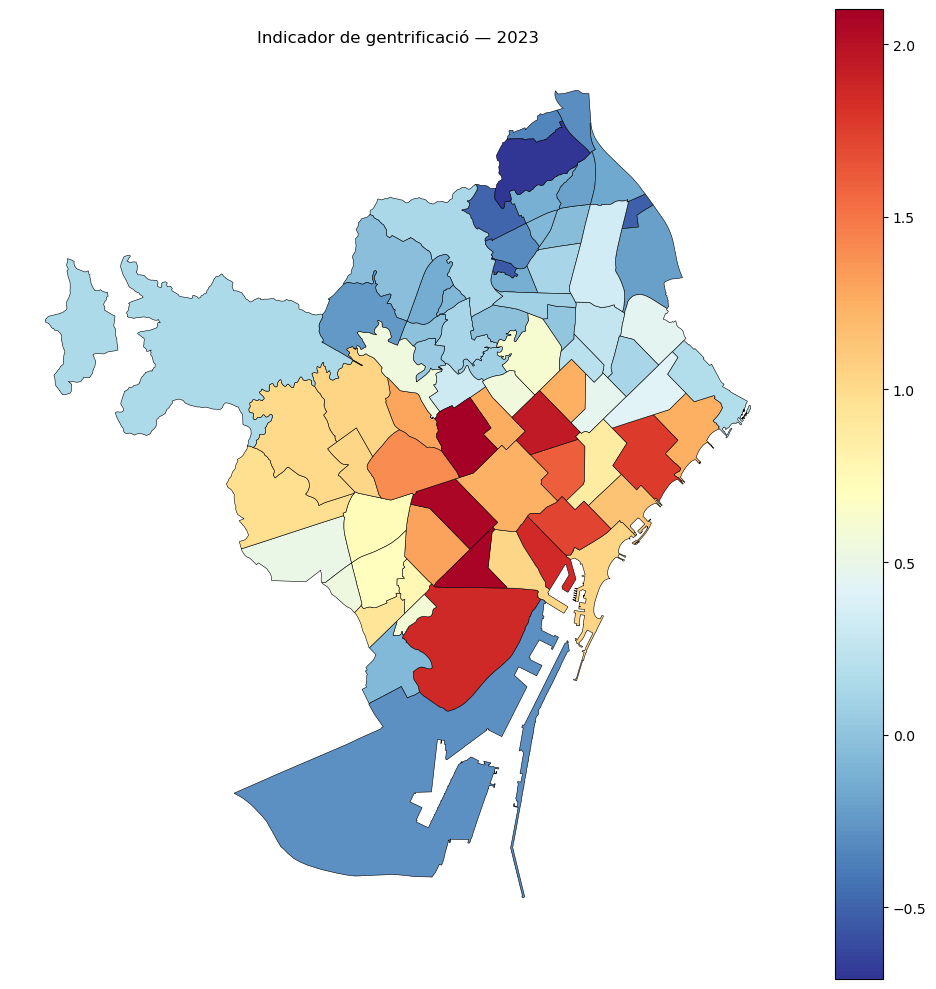

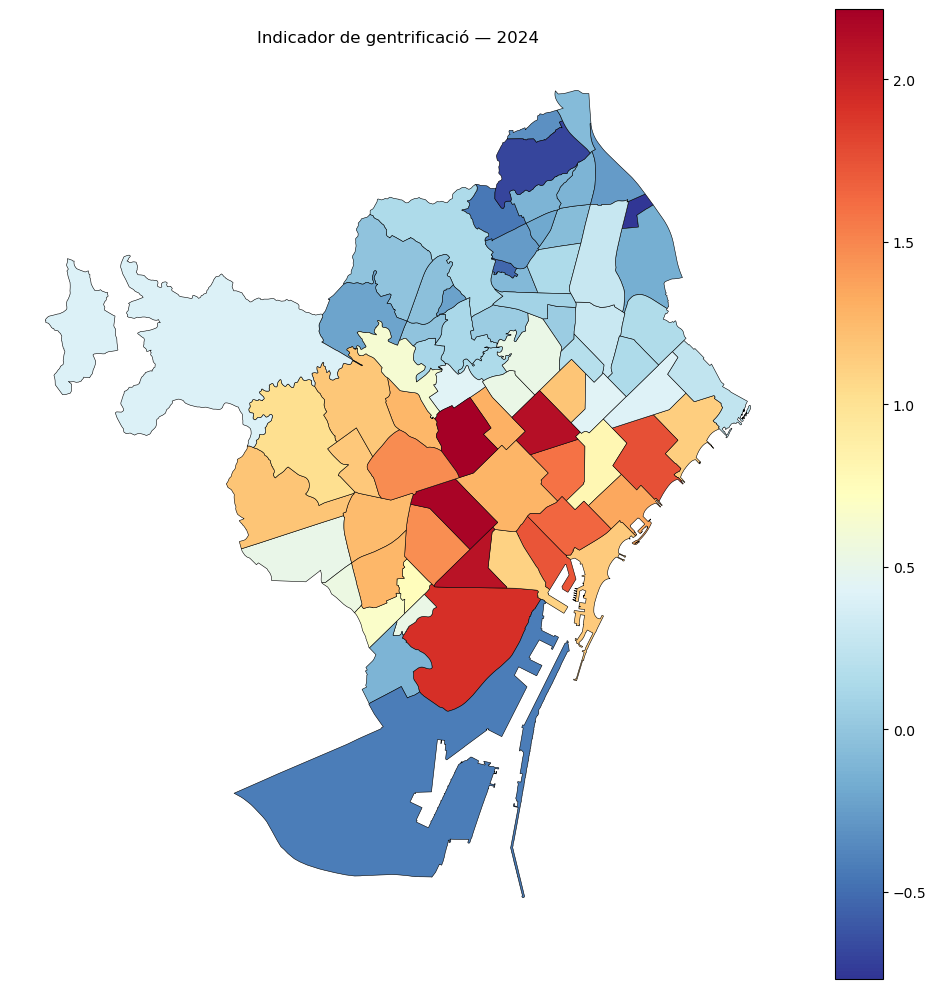

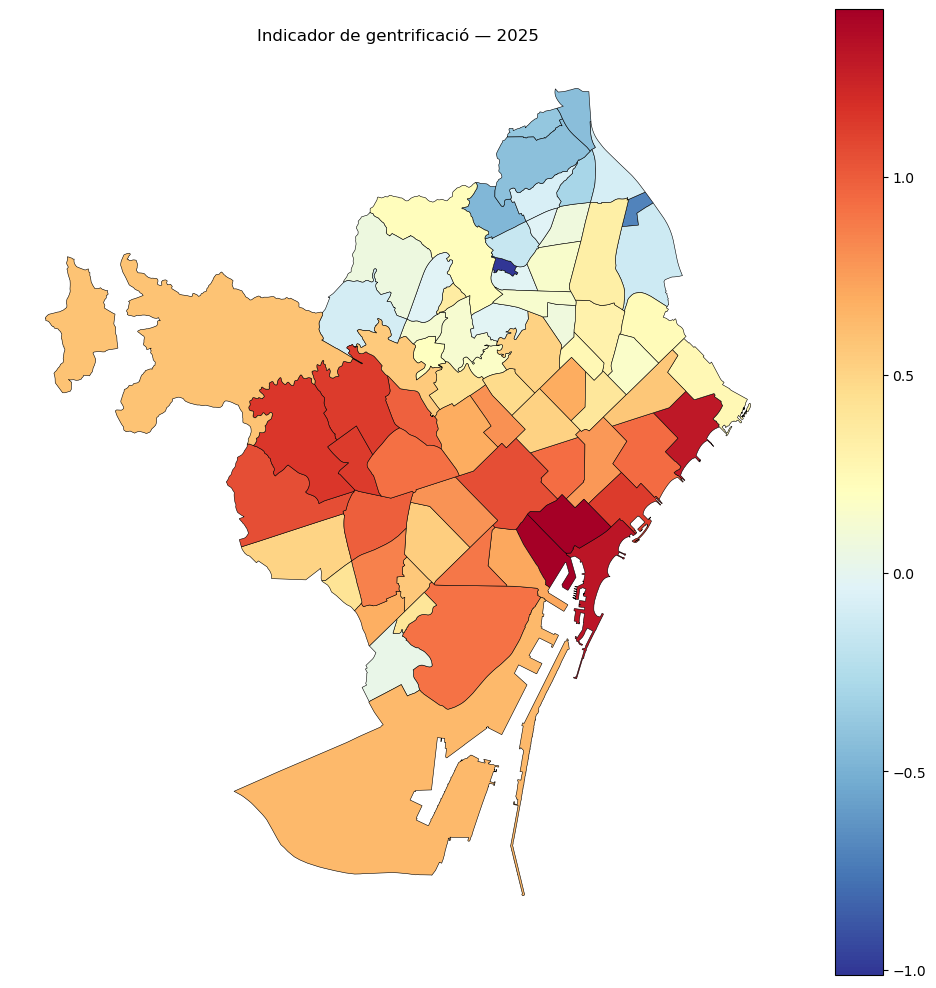

In [104]:
# ==================================================
# Mapes indicador de gentrificació
# ==================================================

print("\nGenerant mapes de gentrificació...")

for any_actual in anys:

    df_year = df_geo[
        df_geo["any"] == any_actual
    ]

    plot_map(

        gdf=df_year,

        column="indicador_gentrificacio",

        title=f"Indicador de gentrificació — {any_actual}",

        cmap="RdYlBu_r",

        categorical=False,

        save_name=f"mapa_gentrificacio_{any_actual}.png",

    )

In [105]:
# ==================================================
# Exportar GeoDataFrame
# ==================================================

print("\nExportant GeoJSON...")

df_geo.to_file(

    DATA_PROCESSED / "df_geo_final.geojson",

    driver="GeoJSON",

)

print("GeoJSON exportat correctament.")


Exportant GeoJSON...
GeoJSON exportat correctament.


In [106]:
# ==================================================
# Estadístiques descriptives
# ==================================================

print("\nCalculant estadístiques descriptives...")

variables = [

    "renda",
    "preu_lloguer",
    "poblacio_total",
    "atur",
    "Educació superior",
    "num_contractes",
    "superficie_mitja",
    "hut",
    "indicador_gentrificacio",

]

# Últim any disponible
last_year = df_geo["any"].max()

df_desc = (

    df_geo[
        df_geo["any"] == last_year
    ]

)

desc = (

    df_desc[variables]
    .describe()
    .T

)

desc = desc[
    ["mean", "std", "min", "50%", "max"]
]

desc.columns = [

    "Mitjana",
    "Desv. estàndard",
    "Mínim",
    "Mediana",
    "Màxim",

]

desc.index = [

    "Renda",
    "Preu lloguer",
    "Població total",
    "Atur",
    "Educació superior",
    "Contractes lloguer",
    "Superfície mitjana",
    "Habitatges turístics",
    "Indicador gentrificació",

]

desc = desc.round(2)

print(desc)


Calculant estadístiques descriptives...
                          Mitjana  Desv. estàndard    Mínim   Mediana  \
Renda                         NaN              NaN      NaN       NaN   
Preu lloguer                 0.93             0.98    -1.48      1.03   
Població total           23726.93         15154.61  1071.00  22767.00   
Atur                      3580.55          2785.48    13.00   2300.00   
Educació superior             NaN              NaN      NaN       NaN   
Contractes lloguer          -0.00             1.00    -1.24     -0.29   
Superfície mitjana          -0.07             1.04    -2.38     -0.31   
Habitatges turístics          NaN              NaN      NaN       NaN   
Indicador gentrificació      0.42             0.52    -1.01      0.42   

                            Màxim  
Renda                         NaN  
Preu lloguer                 3.30  
Població total           59122.00  
Atur                      9520.00  
Educació superior             NaN  
Contractes l

In [107]:
# ==================================================
# Exportar taula LaTeX
# ==================================================

latex_table = desc.to_latex(

    caption=(
        "Estadístiques descriptives de les principals "
        "variables utilitzades en l’estudi."
    ),

    label="tab:estadistica_descriptiva",

    column_format="lccccc",

    escape=False,

)

with open(

    TABLES_DIR / "estadistiques_descriptives.tex",

    "w",
    encoding="utf-8",

) as f:

    f.write(latex_table)

print("\nTaula LaTeX exportada correctament.")


Taula LaTeX exportada correctament.


In [108]:
# ==================================================
# Final
# ==================================================

print("\nNotebook 08_geospatial completat correctament.")


Notebook 08_geospatial completat correctament.
